# Trust region methods

> __trust region methods__ are __more efficient__ from search line methods. Example to RL algorithms that use `line methods` is REINFORCE,AC2. The policy improvment of those gradient policy is based on **starting from big steps and over the time decreased. (when improve by gradient accent/descent)**

> But __trust region methods__  are more efficient then __search line methods__ beacuse its try to find the global min/max in a specific region of the function, and once it found, the __trust region methods__ move the region, until its find the best min/max in a given.

The procces to fine the min/max in __trust region methods__ is look like this:


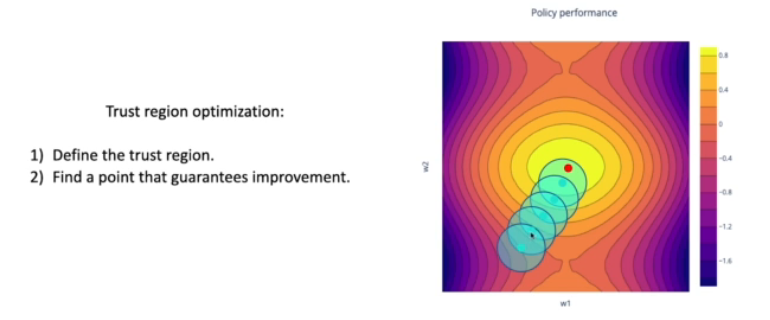

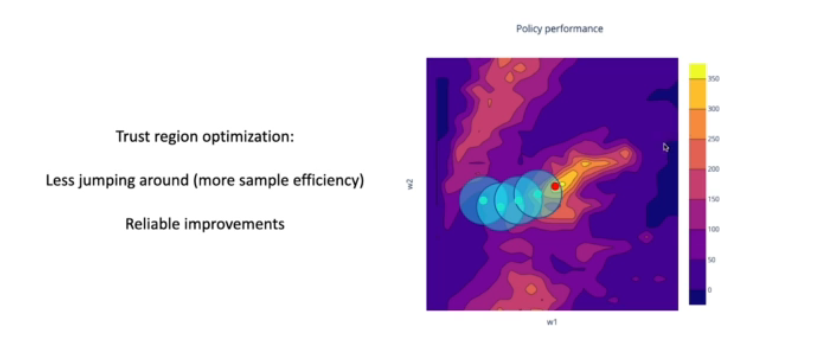

# Kullback-Leibler divergence

> This is a function that measures __how difference two probabilities distributions are from each other.__

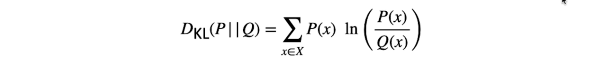

So, we can use this tool to measure the differences between `Policy_1` and `Policy_2`.
> (this is for dicreate action spaces)

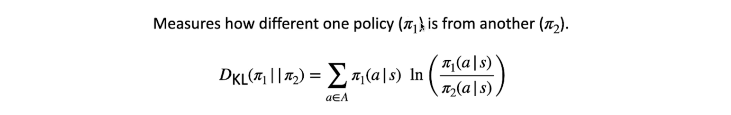

> And for continuous action spaces:


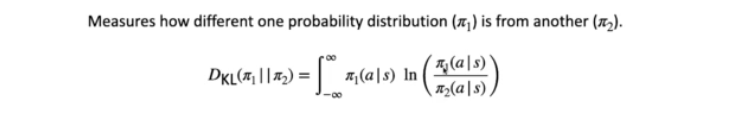

__Let's see a visual representation__


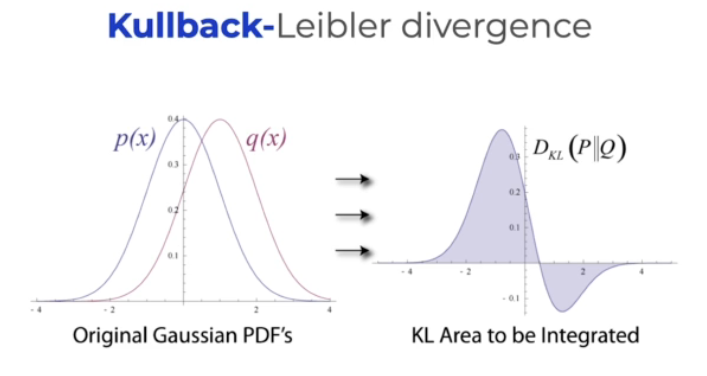

__So now we know how to `drew the boundary`, to take a step that improves our policy.__


__Now, we need to define mathematically the exact problem that we have to solve in order to take a `step inside the boundary`!__
> Its all about the policy performance!

Let's see a formula that know __compare between two policies in the boundary__


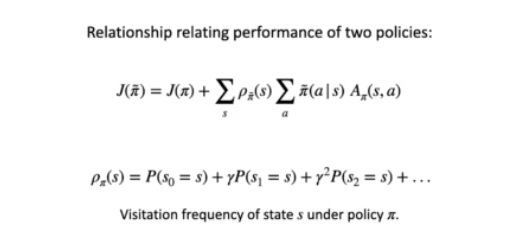

# Proximal Policy Optimization (PPO)


In general, PPO use the methods that we explain above.

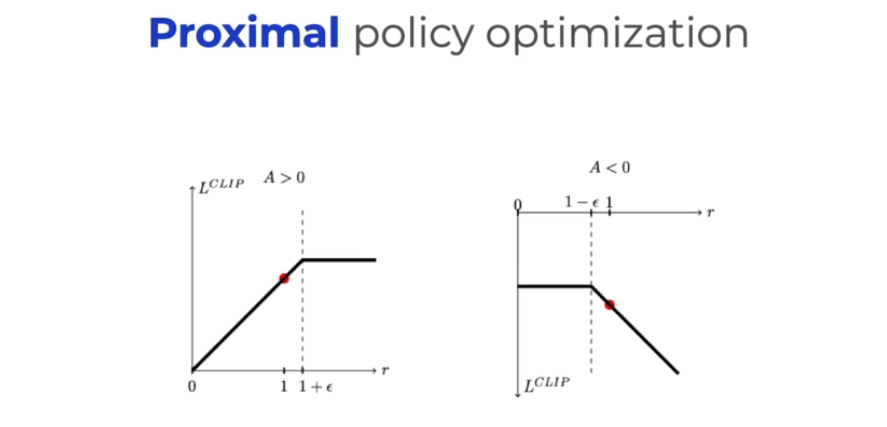

The `PPO` __increase__ the probability of actions that give high values (up to some point, for preventing from over fitting), and decrease the probability of actions that give lower value.  

In [ ]:
!apt-get install -y xvfb

!pip install gym==0.23.1 \
    pytorch-lightning==1.6 \
    pyvirtualdisplay

!pip install -U brax==0.0.12 jax==0.3.14 jaxlib==0.3.14+cuda11.cudnn82 -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html

import warnings
warnings.filterwarnings('ignore')

#### Setup virtual display

In [ ]:
from pyvirtualdisplay import Display
Display(visible=False, size=(1400, 900)).start()

#### Import the necessary code libraries

In [ ]:
import copy
import torch
import random
import gym
import matplotlib
import functools
import itertools
import math

import numpy as np
import matplotlib.pyplot as plt

import torch.nn.functional as F

from collections import deque, namedtuple
from IPython.display import HTML
from base64 import b64encode

from torch import nn
from torch.utils.data import DataLoader
from torch.utils.data.dataset import IterableDataset
from torch.optim import AdamW

from torch.distributions import Normal

from pytorch_lightning import LightningModule, Trainer

import brax
from brax import envs
from brax.envs import to_torch
from brax.io import html

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
num_gpus = torch.cuda.device_count()

v = torch.ones(1, device='cuda')

/usr/local/lib/python3.10/dist-packages/tensorflow/python/framework/dtypes.py:35: DeprecationWarning: ml_dtypes.float8_e4m3b11 is deprecated. Use ml_dtypes.float8_e4m3b11fnuz
  from tensorflow.tsl.python.lib.core import pywrap_ml_dtypes
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/__init__.py:38: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('pytorch_lightning')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  __import__("pkg_resources").declare_namespace(__name__)


In [ ]:
@torch.no_grad()
def create_video(env, episode_length, policy=None):
  """
  Function to create a video.
  """
  qp_array = []
  state = env.reset()
  for i in range(episode_length):
    if policy:
      loc, scale = policy(state)
      sample = torch.normal(loc, scale)
      action = torch.tanh(sample)
    else:
      action = env.action_space.sample()
    state, _, _, _ = env.step(action)
    qp_array.append(env.unwrapped._state.qp)
  return HTML(html.render(env.unwrapped._env.sys, qp_array))


@torch.no_grad()
def test_agent(env, episode_length, policy, episodes=10):
  """
  Testing the agent.

  Parameters:
  -----------
  - `env`: the environment
  - `episode_length`: the len of epicode (how many steps in each epocides)
  - `policy`: the policy
  - `episodes`: number of epicodes.
  """
  ep_returns = [] # list for store the epicode return.
  for ep in range(episodes): # loop for each epicode
    state = env.reset() # get initial state
    done = False
    ep_ret = 0.0 # initial the epicode return variable.

    while not done: # while the game not over....
      loc, scale = policy(state) # given a state, return an action based on the policy
      sample = torch.normal(loc, scale) # create normal distribution
      action = torch.tanh(sample) # transform the dustribution into action
      state, reward, done, info = env.step(action) # perform the action
      ep_ret += reward.item() # update the reward of this epicode.

    # append the total return of the epicode to the list.
    ep_returns.append(ep_ret)

  # return the mean of return of the policy.
  return sum(ep_returns) / episodes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Create the policy

In [ ]:
class GradientPolicy(nn.Module):
  """
  The Gradient Policy for continuing actions.

  return `mean` & `std`, as the moments of the action probability distribution.
  """

  def __init__(self, in_features, out_dims, hidden_size=128):
    super().__init__()
    self.fc1 = nn.Linear(in_features, hidden_size) # Input: state
    self.fc2 = nn.Linear(hidden_size, hidden_size) # Hidden layer
    self.fc_mu = nn.Linear(hidden_size, out_dims)  # Output_1: mean
    self.fc_std = nn.Linear(hidden_size, out_dims) # Output_2: std

  def forward(self, x):
    # forward propegate
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))

    # mean
    loc = self.fc_mu(x)
    loc = torch.tanh(loc)

    # std
    scale = self.fc_std(x)
    scale = F.softplus(scale) + 0.001

    # return mean & std.
    return loc, scale

#### Create the value network

In [ ]:
class ValueNet(nn.Module):
  """
  the Value network.
  Is a neural network that estimate the Value function
  (the expected return for the state that we pass as an argument).

  return -> Value function (1 element.)
  """
  def __init__(self, in_features, hidden_size=128):
    super().__init__()
    self.fc1 = nn.Linear(in_features, hidden_size) # Input: state
    self.fc2 = nn.Linear(hidden_size, hidden_size)
    self.fc3 = nn.Linear(hidden_size, 1) # Output: Value function

  def forward(self, x):
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = self.fc3(x)
    return x # return the estimate Value

#### Create the environment

In [ ]:
class RunningMeanStd:
    # https://en.wikipedia.org/wiki/Algorithms_for_calculating_variance#Parallel_algorithm
    def __init__(self, epsilon=1e-4, shape=()):
        self.mean = torch.zeros(shape, dtype=torch.float32).to(device)
        self.var = torch.ones(shape, dtype=torch.float32).to(device)
        self.count = epsilon

    def update(self, x):
        batch_mean = torch.mean(x, dim=0)
        batch_var = torch.var(x, dim=0)
        batch_count = x.shape[0]
        self.update_from_moments(batch_mean, batch_var, batch_count)

    def update_from_moments(self, batch_mean, batch_var, batch_count):
        self.mean, self.var, self.count = update_mean_var_count_from_moments(
            self.mean, self.var, self.count, batch_mean, batch_var, batch_count
        )


def update_mean_var_count_from_moments(
    mean, var, count, batch_mean, batch_var, batch_count
):
    delta = batch_mean - mean
    tot_count = count + batch_count

    new_mean = mean + delta * batch_count / tot_count
    m_a = var * count
    m_b = batch_var * batch_count
    M2 = m_a + m_b + torch.square(delta) * count * batch_count / tot_count
    new_var = M2 / tot_count
    new_count = tot_count

    return new_mean, new_var, new_count


class NormalizeObservation(gym.core.Wrapper):

    def __init__(self, env, epsilon=1e-8):
        super().__init__(env)
        self.num_envs = getattr(env, "num_envs", 1)
        self.obs_rms = RunningMeanStd(shape=self.observation_space.shape[-1])
        self.epsilon = epsilon

    def step(self, action):
        obs, rews, dones, infos = self.env.step(action)
        obs = self.normalize(obs)
        return obs, rews, dones, infos

    def reset(self, **kwargs):
        return_info = kwargs.get("return_info", False)
        if return_info:
            obs, info = self.env.reset(**kwargs)
        else:
            obs = self.env.reset(**kwargs)
        obs = self.normalize(obs)
        if not return_info:
            return obs
        else:
            return obs, info

    def normalize(self, obs):
        self.obs_rms.update(obs)
        return (obs - self.obs_rms.mean) / torch.sqrt(self.obs_rms.var + self.epsilon)

In [ ]:
# Register the `brax-ant-v0` env to the gym library!
entry_point = functools.partial(envs.create_gym_env, env_name='ant')
gym.register('brax-ant-v0', entry_point=entry_point)

In [ ]:
# Create the env, wrap in a torch (we use Pytorch)
env = gym.make("brax-ant-v0", episode_length=1000)
env = to_torch.JaxToTorchWrapper(env, device=device)

# Create a video with random policy.
# if we dont sent the policy as an argument, its will use random policy.
create_video(env, 1000)

In [ ]:
def create_env(env_name, num_envs=256, episode_length=1000):
  """
  Create multiple envs, and wrap it to work with Pytorch.
  """
  env = gym.make(env_name, batch_size=num_envs, episode_length=episode_length)
  env = to_torch.JaxToTorchWrapper(env, device=device)
  env = NormalizeObservation(env)
  return env

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Create 10 envs using the function
env = create_env('brax-ant-v0', num_envs=10)

# get the initial state (first observation)
obs = env.reset()

# print the number of env, and the dimenstions of the observation
print("Num envs: ", obs.shape[0], "Obs dimentions: ", obs.shape[1])


Num envs:  10 Obs dimentions:  87


In [ ]:
# see the action space.
env.action_space

# interpretation:
# 1. (-1.0, 1.0) ==> the action space have range of [-1,1].
# 2. (10, 8) ==> there is 10 environments,
#    each environment have 8 action to perform in each state.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Box(-1.0, 1.0, (10, 8), float32)

In [ ]:
# perform an action, inspect the results
obs, reward, done, info = env.step(env.action_space.sample())

In [ ]:
info.keys()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


dict_keys(['reward_contact_cost', 'reward_ctrl_cost', 'reward_forward', 'reward_survive'])

#### Create the dataset

In [ ]:
class RLDataset(IterableDataset):
  """
  An iterble data set that inherit from `IterableDataset` class.

  As PPO (that need to use in the same samples number of time),
  we need to adjust this dataset to have the ability produce
  the same set of samples in a given number of times.

  Parameters:
  -----------
  - `env`: the environment.
  - `policy`: the policy (a neural network policy).
  - `samples_per_epoch`: how many samples produce in each epoch.
  - `epoch_repeat`: how many times to repeat on the same epoch. (the PPO technique)
  """

  def __init__(self, env, policy, samples_per_epoch, epoch_repeat):
    self.env = env
    self.policy = policy
    self.samples_per_epoch = samples_per_epoch
    self.epoch_repeat = epoch_repeat
    self.obs = self.env.reset()

  @torch.no_grad()
  def __iter__(self):
    """
    The iter function
    """
    ## generete samples
    # initial list to store the transitions: (s', mean, std, a, r, done, s')
    transitions = []
    for step in range(self.samples_per_epoch): # loop over samples per epoch
      loc, scale = self.policy(self.obs) # get action from policy
      action = torch.normal(loc, scale) # create the action probabilit normal distribution
      next_obs, reward, done, info = self.env.step(action) # perform the action
      transitions.append((self.obs, loc, scale, action, reward, done, next_obs)) # appen the transition
      self.obs = next_obs # update the observation.

    ## Create a tensors for each of the component of the transition
    # define the number of rows: numbrt of ens * the samples in each epoch.
    # this is the number of rows that we want in each tensor!
    # (e.g: (num_envs*samples_per_epoch) rows in the `obs_b` tensor, an so on..
    num_samples = self.env.num_envs * self.samples_per_epoch
    # reshape function for take each of the tensor (of the obs,action, etc)
    # and modify their shape to be:
    # - `num_samples` rows
    # - `-1` -> fill columns shape automatically.
    reshape_fn = lambda x: x.view(num_samples, -1)
    # decompose the transition list. the result will be:
    # collection of the tensors with the same element
    batch = map(torch.stack, zip(*transitions))
    # reshape & extract each component: now each component have its own tensor.
    # tensor of observation, tensor of actions, and so on..
    obs_b, loc_b, scale_b, action_b, reward_b, done_b, next_obs_b = map(reshape_fn, batch)


    # After we have the batches,
    # pass them into our data loader given number of time.
    # this is where we push the same batch many time (as the PPO technique)
    for repeat in range(self.epoch_repeat): # repeat..
      # create list of the indexes of all the elements
      idx = list(range(num_samples))
      # shuffle the index of the same batch
      random.shuffle(idx)

      # return the transition: (s, mean, std, a, r, done, s')
      for i in idx:
        yield obs_b[i], loc_b[i], scale_b[i], action_b[i], reward_b[i], done_b[i], next_obs_b[i]

## Create the PPO algorithm
__PPO builds upon the policy gradient methods and addresses some of their limitations. Let's delve into the key aspects of PPO and what it aims to improve:__

1. `Policy Gradient Methods:`: PPO is a type of policy gradient method, where the objective is to directly optimize the policy of the agent. In traditional policy gradient methods, the policy is updated based on the expected return of sampled trajectories. However, __these methods can suffer from high variance and instability during training.__ (THIS IS WHAT THE PPO COME TO FIX)
2. `Clipped Surrogate Objective:` One of the central innovations of PPO is the introduction of a clipped surrogate objective. Instead of updating the policy based on the raw advantage estimates, PPO clips the policy update to be within a certain range. This helps in preventing large policy updates that can lead to instability.
3. `Stability and Robustness:` PPO is designed to be more stable and robust during training. The use of a clipped surrogate objective, as well as other design choices, contributes to stable learning even in environments with non-stationary dynamics or noisy rewards.
4. `Balance between Exploration and Exploitation:`: PPO seeks to find a balance between exploration and exploitation. The algorithm encourages policy updates that improve performance while constraining the updates to prevent large deviations from the current policy. This helps in achieving a balance between exploring new actions and exploiting known good actions.
5. `Sample Efficiency:` PPO aims to make __more efficient use of collected samples__. By __`reusing the same samples multiple times`__ (using multiple optimization epochs), __PPO improves sample efficiency__, allowing the algorithm to __extract more information from the available data.__
6. `Handling Non-Stationarity:` Environments in reinforcement learning can be non-stationary, meaning that the dynamics may change over time. PPO addresses this by using multiple passes over the same samples, providing a more stable learning signal and helping the algorithm adapt to changes in the environment.
7. `Regularization through Entropy:` PPO incorporates entropy regularization to encourage policies with higher entropy, promoting exploration. Entropy is a measure of uncertainty in the policy, and by penalizing policies that are too deterministic, PPO encourages the agent to explore different actions.
8. `Parallelization and Scalability:` PPO can be implemented in a parallelized and distributed manner, making it scalable to handle large-scale training scenarios. This allows for more efficient use of computational resources, especially in deep reinforcement learning applications.

>

- PPO is designed to be a "proximal" policy optimization method.
- "proximal" implies that the policy update should be close to the current policy to ensure stability.
- By choosing the minimum surrogate, the algorithm penalizes policy updates that deviate too far from the previous policy.


In [ ]:
class PPO(LightningModule):
  """
  PPO
  ====
  The proximal policy optimization algorithm using the `LightningModule`.

  Parameters:
  -----------
  - `env_name`: the name of the environment
  - `num_envs`: the number of the environments
  - `episode_length`: the length of each epicode (how many steps in each episode)
  - `batch_size`: batch size (how mant samples'll process at once)
  - `hidden_size`: number if hidden layer (for the Policy/Value neural networks)
  - `samples_per_epoch`: number of samples per epoch
  - `epoch_repeat`: how many times repeat on the observation in a given epoch (part from the PPO technique)
  - `policy_lr`: learning rate of the policy ANN
  - `value_lr`: learning rate for the policy ANN
  - `gamma`: discount factor for update the target (V(s))
  - `epsilon`: will clip the change of our policy that we going to apply
  - `entropy_coef`: the coefficient of entropy (how much entropy'll effect the loss
                                                and Keeping the exploration high?)
  - `optim`: optimizer function (for update the weights of the Policy/Value ANNs )

  """

  def __init__(self, env_name, num_envs=2048, episode_length=1000,
               batch_size=1024, hidden_size=256, samples_per_epoch=5,
               epoch_repeat=8, policy_lr=1e-4, value_lr=1e-3, gamma=0.97,
               epsilon=0.3, entropy_coef=0.1, optim=AdamW):

    super().__init__()

    self.env = create_env(env_name, num_envs=num_envs, episode_length=episode_length) # create env(s)
    test_env = gym.make(env_name, episode_length=episode_length) # make test env
    test_env = to_torch.JaxToTorchWrapper(test_env, device=device) # wrap the test env that data'll work with Pytorch
    self.test_env = NormalizeObservation(test_env) # normalize the observation
    self.test_env.obs_rms = self.env.obs_rms # set the root mean square of the observation

    obs_size = self.env.observation_space.shape[1] # Input shape for the ANNs (state -> extract the observation size)
    action_dims = self.env.action_space.shape[1] # Output shape the ANNs(actions)

    self.policy = GradientPolicy(obs_size, action_dims, hidden_size) # create the Policy ANN
    self.value_net = ValueNet(obs_size, hidden_size) # create the Value ANN
    self.target_value_net = copy.deepcopy(self.value_net) # create the target value ANN (the ANN that'll compute the target value, the true.)

    self.dataset = RLDataset(self.env, self.policy, samples_per_epoch, epoch_repeat) # create the our iterble dataset.

    self.save_hyperparameters() # for convince, save the hyperparameters
    self.videos = [] # initial list for store the videos.


  def configure_optimizers(self):
    """
    Function for configure the optimization function for both the Policy/Value ANNs.
    - it going to optimzie the weigths of each ANN.
    """
    value_opt = self.hparams.optim(self.value_net.parameters(), lr=self.hparams.value_lr) # Value ANN optimizezr
    policy_opt = self.hparams.optim(self.policy.parameters(), lr=self.hparams.policy_lr) # Policy ANN optimizezr
    return value_opt, policy_opt # return the optimizers.

  def train_dataloader(self):
    """
    Function for pass our batch dataset into data loader for train the agent.
    """
    return DataLoader(dataset=self.dataset, # the dataset object.
                      batch_size=self.hparams.batch_size) # the batch size.

  def training_step(self, batch, batch_idx, optimizer_idx):
    """
    Execute a training step on a batch.

    Parameters:
    -----------
    - `batch`: the batch
    - `batch_idx`: its index
    - `optimizer_idx`: its optimizer.
    """

    # take the tensors of the:
    # (observations, mean, std, action, reward, done, next observation)
    obs_b, loc_b, scale_b, action_b, reward_b, done_b, next_obs_b = batch

    # 1. Compute the state values using the value network
    # - V(s): this is the cumelative reward from a state.
    state_values = self.value_net(obs_b)

    # 2. Compute the target values (using the target net) for the value network
    with torch.no_grad():
      # take the value of the next state
      next_state_values = self.target_value_net(next_obs_b)
      # make sure that you done take extra rewards.
      next_state_values[done_b.bool()] = 0.0
      # calculate the target
      # (this is the true state-value is our agent act based on the policy.)
      target = reward_b + self.hparams.gamma * next_state_values

    # 3. Value Network Optimization
    # After we have the value and the target value,
    # let's calculate the loss for updating the Value Network.
    if optimizer_idx == 0:
      loss = F.smooth_l1_loss(state_values, target)
      self.log("episode/Value Loss", loss)
      return loss

    # 4. Policy Network Optimization
    # - updating the policy.
    elif optimizer_idx == 1:
      # Compute advantages for policy optimization
      advantages = (target - state_values).detach()

      # 5. Compute the new policy distribution parameters
      # - take the mean and std based on our policy (given a state)
      new_loc, new_scale = self.policy(obs_b)
      # - create action probability normal distribution
      dist = Normal(new_loc, new_scale)
      # - compute & sum the log probability of the distribution
      log_prob = dist.log_prob(action_b).sum(dim=-1, keepdim=True)

      # 6. Compute the previous policy distribution parameters
      # its corresponding to the Policy before the updates of this epoch.
      # - take take action probability normal dist of the previous mean & std
      prev_dist = Normal(loc_b, scale_b)
      # - compute & sum the log probability of the prev distribution
      prev_log_prob = prev_dist.log_prob(action_b).sum(dim=-1, keepdim=True)

      # 7. Compute the ratio (rho) and surrogate objectives.
      # this is foinf to be the exponential different between the
      # sum of log probability of the updated policy to the sun of log probability of the previous policy!
      rho = torch.exp(log_prob - prev_log_prob)
      # now we compute two loss function, and after that'll choose the min:
      # - loss_1
      surrogate_1 = rho * advantages
      # - loss_2: clip the rho value between this range:
      surrogate_2 = rho.clip(1 - self.hparams.epsilon, 1 + self.hparams.epsilon) * advantages

      # 8. Compute the policy loss (take the minimum!)
      # The policy loss is calculated by taking the negative minimum of the two surrogate objectives.
      # why?
      # - This step ensures that the policy does not deviate too far from the previous policy.
      #   - in other words, by this technique we reach more stability learning process.
      policy_loss = - torch.minimum(surrogate_1, surrogate_2)
      # 9. Compute the entropy for regularization
      entropy = dist.entropy().sum(dim=-1, keepdim=True)
      # 10. Compute the total loss for policy optimization
      loss = policy_loss - self.hparams.entropy_coef * entropy

      # 11. Logging for monitoring training progres
      self.log("episode/Policy Loss", policy_loss.mean())
      self.log("episode/Entropy", entropy.mean())
      self.log("episode/Reward", reward_b.mean())
      return loss.mean()

  def training_epoch_end(self, training_epoch_outputs):
    """
    Callback function where a training epicode is done.
    """
    # 1. Update the parameters of `target_value_net` by the parameters of `value_net`
    self.target_value_net.load_state_dict(self.value_net.state_dict())

    if self.current_epoch % 10 == 0:
      # each 10 training epochs test the agent.
      average_return = test_agent(self.test_env, self.hparams.episode_length, self.policy, episodes=1)
      self.log("episode/Average Return", average_return)

    if self.current_epoch % 50 == 0:
      # each 50 training epoch create a video.
      video = create_video(self.test_env, self.hparams.episode_length, policy=self.policy)
      self.videos.append(video)

#### Purge logs and run the visualization tool (Tensorboard)

In [ ]:
# Start tensorboard.
!rm -r /content/lightning_logs/
!rm -r /content/videos/
%load_ext tensorboard
%tensorboard --logdir /content/lightning_logs/

Output hidden; open in https://colab.research.google.com to view.

#### Train the policy

In [ ]:
algo = PPO("brax-ant-v0")

trainer = Trainer(gpus=num_gpus, max_epochs=500)

trainer.fit(algo)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/torch/distributed/_sharded_tensor/__init__.py:8: DeprecationWarning: torch.distributed._sharded_tensor will be deprecated, use torch.distributed._shard.sharded_tensor instead
  warnings.warn(
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True, used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.gpu:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_l

Training: 0it [00:00, ?it/s]

In [ ]:
len(algo.videos)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


10

In [ ]:
algo.videos[9]